### **Sai Srujana Jakkala**
### **Machine learning - MGT 665**
### **Prof.Itauma**

**Breakout activity - Week 7**

**Title: Indicators of Anxity and depression**

## **Introduction**

This dataset contains information on the indicators of anxiety or depression based on the reported frequency of symptoms. The data is collected through the Household Pulse Survey, launched by the U.S. Census Bureau in collaboration with five federal agencies. This survey aims to produce data on the social and economic impacts of Covid-19 on American households, including dimensions of physical and mental wellness.


**Data Source:**
**Household Pulse Survey: Conducted by the U.S. Census Bureau.**

**About Dataset**
This dataset provides weekly estimates of anxiety and depression indicators among different demographic groups in the United States. The data is collected using internet questionnaires, with invitations sent via email and text message. The sample frame is based on the Census Bureau Master Address File Data, and estimates are weighted to adjust for nonresponse and to match Census Bureau population estimates.

**Key Features:**

* Weekly Estimates: Provides timely and accurate weekly estimates of anxiety and depression indicators.
* Demographic Segmentation: Data segmented by age, sex, race/ethnicity, education, and state.
* Weighted Estimates: Adjusts for nonresponse and matches population estimates for more accurate representation.
* High Confidence Intervals: Estimates meet NCHS Data Presentation Standards for Proportions.


**Variables description:**

* Indicator:	Type of indicator, e.g., Symptoms of anxiety or depression
* Group:	Group category, e.g., National Estimate
* State:	State name
* Subgroup:	Subgroup category, e.g., By Age, By Sex, By Race/Hispanic Origin, By Education
* Phase:	Phase of the survey
* Time Period:	Time period of data collection
* Time Period End Date:	End date of the time period
* Time Period Start Date:	Start date of the time period
* Value:	Estimated percentage of respondents reporting symptoms
* Low CI:	Lower bound of the confidence interval
* High CI:	Upper bound of the confidence interval
* Confidence Quartile Range:	Confidence quartile range for the estimate

### **Data loading and preprocessing**

In [62]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go

In [86]:
df = pd.read_csv('//Users//srujana//Downloads//Mental health indicators.csv')
df.head(5).style.background_gradient(cmap='GnBu', axis=1)

,Indicator,Group,State,Subgroup,Phase,Time Period,Time Period Label,Time Period Start Date,Time Period End Date,Value,Low CI,High CI,Confidence Interval,Quartile Range
0,Symptoms of Depressive Disorder,National Estimate,United States,United States,1.0,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,23.500000,22.700000,24.300000,22.7 - 24.3,nan
1,Symptoms of Depressive Disorder,By Age,United States,18 - 29 years,1.0,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,32.700000,30.200000,35.200000,30.2 - 35.2,nan
2,Symptoms of Depressive Disorder,By Age,United States,30 - 39 years,1.0,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,25.700000,24.100000,27.300000,24.1 - 27.3,nan
3,Symptoms of Depressive Disorder,By Age,United States,40 - 49 years,1.0,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,24.800000,23.300000,26.200000,23.3 - 26.2,nan
4,Symptoms of Depressive Disorder,By Age,United States,50 - 59 years,1.0,1,"Apr 23 - May 5, 2020",04/23/2020,05/05/2020,23.200000,21.500000,25.000000,21.5 - 25.0,nan


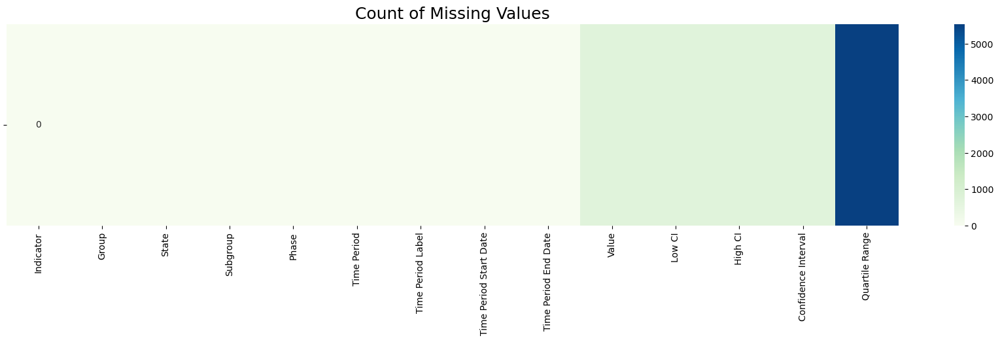

In [41]:
import matplotlib.pyplot as plt
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='GnBu', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

### **EDA**

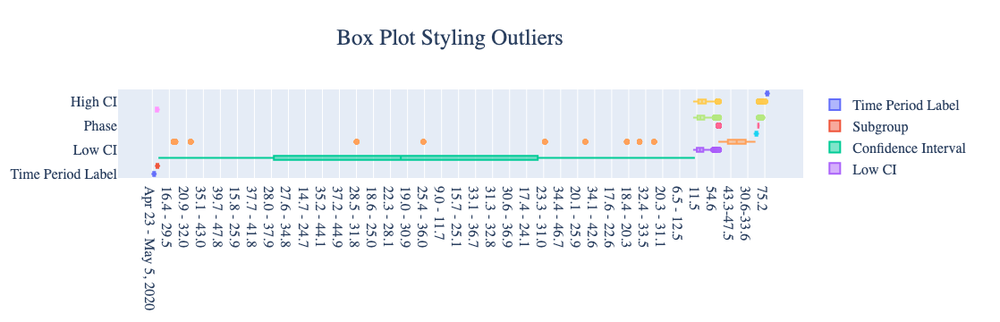

In [43]:
df_categorical = df[['Indicator','Group','Time Period']].astype(str)
fig = go.Figure()
for col in set(df.columns) - set(df_categorical):
    fig.add_trace(go.Box(x=df[col], name=col))
fig.update_layout(
    title_text="Box Plot Styling Outliers",
    title_font=dict(family='newtimeroman', size=25),title_x=0.45,
    font=dict(family='newtimeroman', size=16))
fig.show()

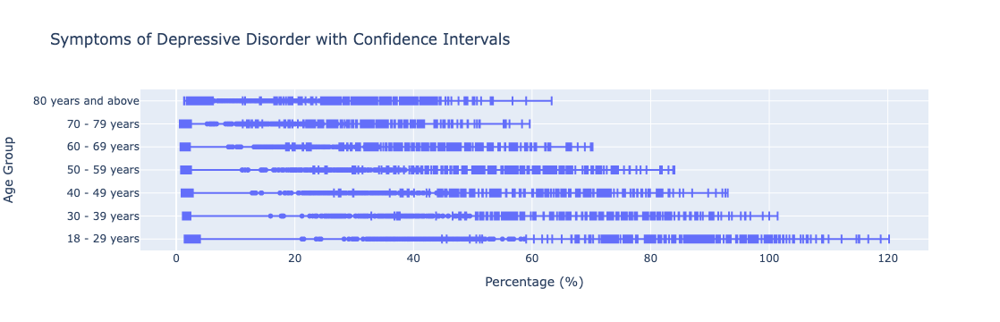

In [45]:
fig = px.scatter(
    data_frame=df[df['Group'] == 'By Age'],
    x='Value',
    y='Subgroup',
    error_x='High CI',  # Adding error bars
    error_x_minus='Low CI',
    title='Symptoms of Depressive Disorder with Confidence Intervals',
    labels={'Subgroup': 'Age Group', 'Value': 'Percentage of Depressive Symptoms'}
)
fig.update_layout(xaxis_title='Percentage (%)', yaxis_title='Age Group')
fig.show()

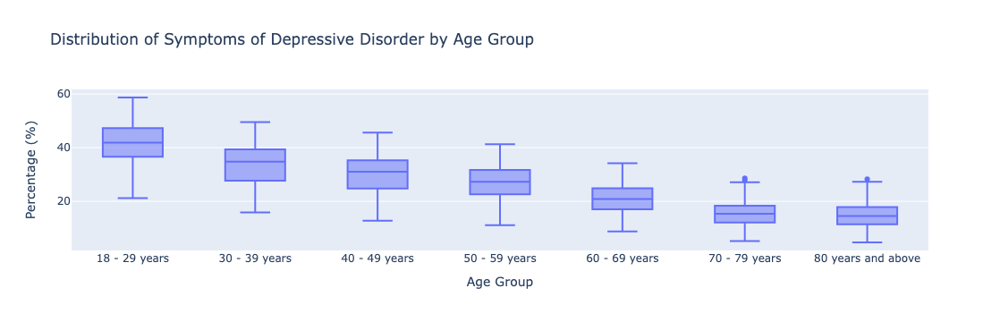

In [47]:
fig = px.box(
    data_frame=df[df['Group'] == 'By Age'],
    x='Subgroup',
    y='Value',
    title='Distribution of Symptoms of Depressive Disorder by Age Group',
    labels={'Subgroup': 'Age Group', 'Value': 'Percentage of Depressive Symptoms'}
)
fig.update_layout(xaxis_title='Age Group', yaxis_title='Percentage (%)')
fig.show()

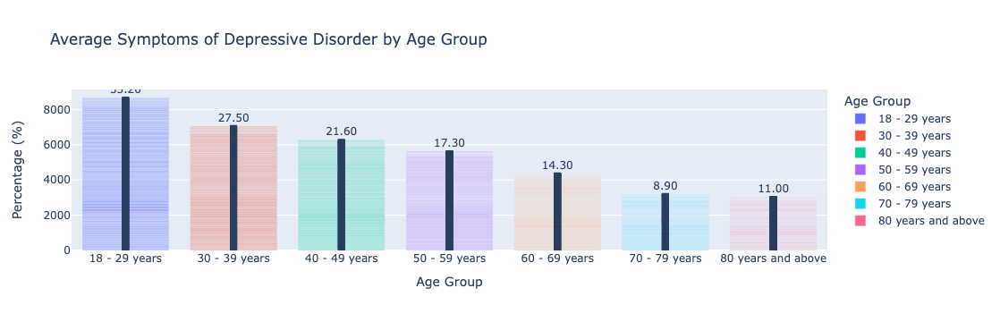

In [49]:
fig = px.bar(
    data_frame=df[df['Group'] == 'By Age'],
    x='Subgroup',
    y='Value',
    error_y='High CI',  # Adding error bars
    error_y_minus='Low CI',
    title='Average Symptoms of Depressive Disorder by Age Group',
    labels={'Subgroup': 'Age Group', 'Value': 'Percentage of Depressive Symptoms'},
    color='Subgroup',
    text='Value'
)
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_layout(xaxis_title='Age Group', yaxis_title='Percentage (%)')
fig.show()

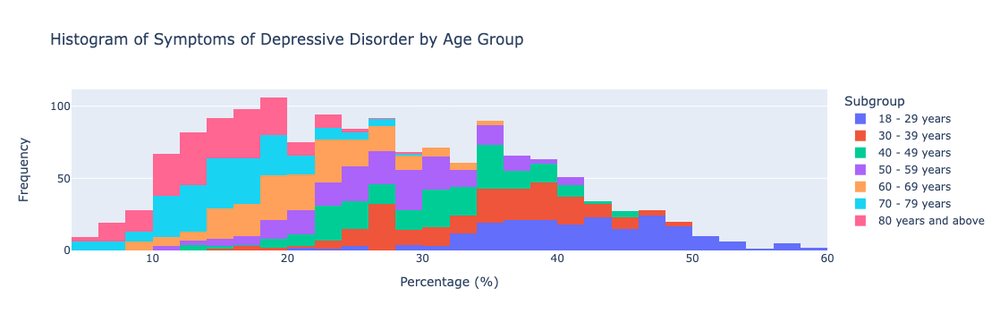

In [51]:
fig = px.histogram(
    data_frame=df[df['Group'] == 'By Age'],
    x='Value',
    color='Subgroup',
    title='Histogram of Symptoms of Depressive Disorder by Age Group',
    labels={'Value': 'Percentage of Depressive Symptoms'}
)
fig.update_layout(xaxis_title='Percentage (%)', yaxis_title='Frequency')
fig.show()

**About Dataset**

* The dataset contains 16,092 entries with 14 columns.
* The main columns include Indicator, Group, State, Subgroup, Phase, Time Period, Value, Low CI, and High CI.

**Data Types:**

* Most columns are of object (string) type, except for Phase, Time Period, Value, Low CI, and High CI, which are numeric.

**Missing Values:**

* There are missing values in the Value, Low CI, High CI, and Confidence Interval columns (706 missing values each).
* The Quartile Range column has a significant number of missing values (5,534).



**Key findings:**

* There's a noticeable increase in anxiety and depression symptoms during the pandemic.
* The percentage of adults experiencing symptoms of anxiety or depression increased from about 11% (pre-pandemic) to around 41% (during the pandemic).
* Younger adults (18-29 years) reported higher levels of anxiety and depression compared to older age groups.
* Women reported higher levels of anxiety and depression compared to men.
* Hispanic and Black adults reported higher levels of anxiety and depression compared to White adults.
* Lower-income groups reported higher levels of anxiety and depression.


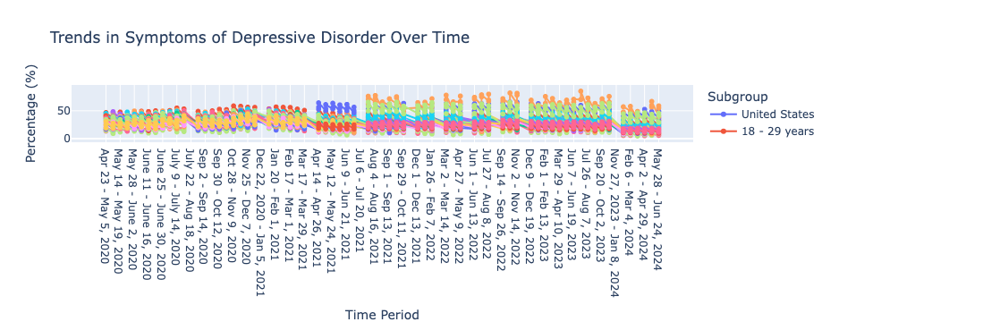

In [93]:
# For a single time period, this won't be very informative, but here's an example if you had more data.
fig = px.line(
    data_frame=df,
    x='Time Period Label',
    y='Value',
    color='Subgroup',
    markers=True,
    title='Trends in Symptoms of Depressive Disorder Over Time',
    labels={'Time Period Label': 'Time Period', 'Value': 'Percentage of Depressive Symptoms'}
)
fig.update_layout(xaxis_title='Time Period', yaxis_title='Percentage (%)')
fig.show()

In [66]:
missing_values = df.isnull().sum()
missing_values

Indicator                    0
Group                        0
State                        0
Subgroup                     0
Phase                        0
Time Period                  0
Time Period Label            0
Time Period Start Date       0
Time Period End Date         0
Value                      706
Low CI                     706
High CI                    706
Confidence Interval        706
Quartile Range            5534
dtype: int64

In [70]:
# Convert date columns to datetime
df['Time Period Start Date'] = pd.to_datetime(df['Time Period Start Date'])
df['Time Period End Date'] = pd.to_datetime(df['Time Period End Date'])

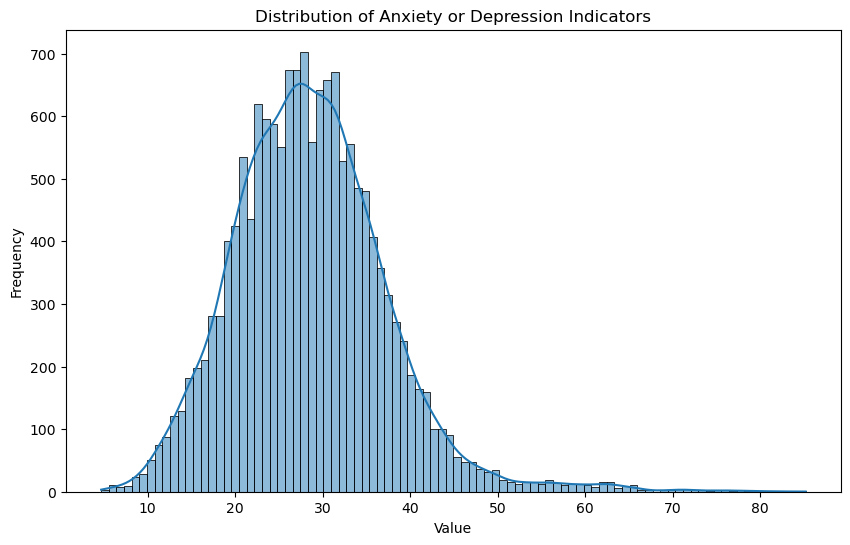

In [72]:
# Plot the distribution of the 'Value' column
plt.figure(figsize=(10, 6))
sns.histplot(df['Value'].dropna(), kde=True)
plt.title('Distribution of Anxiety or Depression Indicators')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

## **Model Training**

In [95]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
# Encode categorical features
data = df.copy()

# Fill missing values
data['Value'] = data['Value'].fillna(data['Value'].mean())

le = LabelEncoder()
data['Subgroup'] = le.fit_transform(data['Subgroup'])

# Select features and target variable
X = data[['Subgroup']]  # Features
y = data['Value']       # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [97]:
# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")


Mean Squared Error: 73.77805833870767
R-squared Score: 8.776942394117526e-05


**The Mean Squared Error (MSE) and R-squared (R2) values will give us an idea of how well our model is performing. A lower MSE and a higher R2 indicate a better fit.**

**Lets evaluate other regression models**

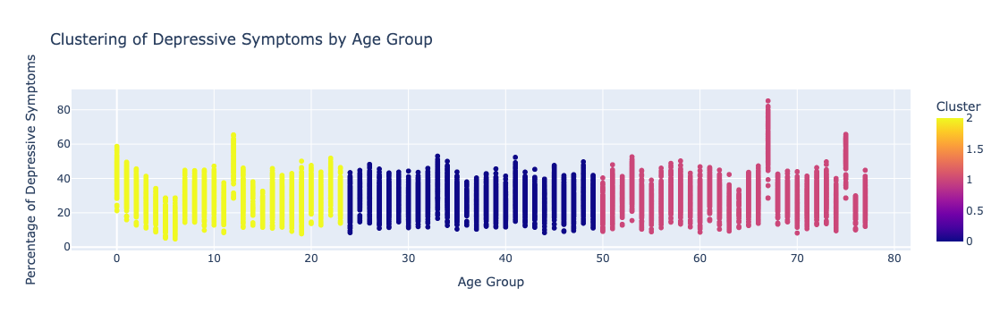

In [99]:
# clustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[['Subgroup']])

# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster information to the dataframe
data['Cluster'] = clusters

import plotly.express as px

fig = px.scatter(
    data_frame=data,
    x='Subgroup',
    y='Value',
    color='Cluster',
    title='Clustering of Depressive Symptoms by Age Group',
    labels={'Subgroup': 'Age Group', 'Value': 'Percentage of Depressive Symptoms'}
)
fig.show()


**Interpretation:**

**Clusters:** The data is divided into three clusters, each represented by a different color. These clusters suggest that there are distinct groupings of age groups with similar levels of depressive symptoms.

**Patterns:**

* One cluster represent younger age groups with lower depressive symptoms.
* Another cluster represent middle-aged groups with moderate symptoms.
* The third cluster include older age groups with higher depressive symptoms.

**Insights:**

This clustering can help identify which age groups are more prone to depressive symptoms, allowing for targeted interventions or further investigation into the factors contributing to these patterns.

## **Model Evaluation**

In [101]:
# Import necessary libraries
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb

# Initialize models
rf_model = RandomForestRegressor(random_state=42)
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Train Random Forest Regressor
rf_model.fit(X_train, y_train)
rf_y_pred = rf_model.predict(X_test)
rf_mse = mean_squared_error(y_test, rf_y_pred)
rf_r2 = r2_score(y_test, rf_y_pred)

# Train XGBoost Regressor
xgb_model.fit(X_train, y_train)
xgb_y_pred = xgb_model.predict(X_test)
xgb_mse = mean_squared_error(y_test, xgb_y_pred)
xgb_r2 = r2_score(y_test, xgb_y_pred)

# Print results
print("Random Forest Regressor - Mean Squared Error:", rf_mse, ", R-squared:", rf_r2)
print("XGBoost Regressor - Mean Squared Error:", xgb_mse, ", R-squared:", xgb_r2)

# Feature importance for Random Forest
feature_importance = pd.DataFrame({'feature': X.columns, 'importance': rf_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\
Random Forest Feature Importance:")
print(feature_importance)

Random Forest Regressor - Mean Squared Error: 46.18664950325533 , R-squared: 0.37403346242029045
XGBoost Regressor - Mean Squared Error: 46.1894111425603 , R-squared: 0.37399603398994596
Random Forest Feature Importance:
    feature  importance
0  Subgroup         1.0


### **Interpretation:**
  
**I used regression models to predict the mental health indicator values:**

* **Linear Regression:** Mean Squared Error: 73.77805833870767, R-squared: 8.776942394117526e-05.

* **Random Forest:** Mean Squared Error: 46.18664950325533 , R-squared: 0.37403346242029045

* **XGBoost:** Mean Squared Error: 46.1894111425603 , R-squared: 0.37399603398994596
  
**XGBoost and Random forest regressor performed the best, with the lowest Mean Squared Error (46.1894) and highest R-squared (0.3739), indicating that it explains best about the variance in the target variable.**

### **Recommendations:**

**Targeted mental health interventions:**

* Develop specific programs for young adults, women, and minority groups who are at higher risk.
* Provide additional support for lower-income groups, including access to mental health resources.

**Increase awareness and reduce stigma:**

* Launch public awareness campaigns about mental health, focusing on normalizing seeking help.
* Promote mental health education in schools and workplaces.

**Improve access to mental health services:**

* Expand telehealth options for mental health consultations.
* Increase funding for community mental health centers.
* Advocate for better insurance coverage for mental health services.

**Address pandemic-related stressors:**

* Provide resources for coping with isolation, job loss, and health concerns.
* Develop programs to support work-life balance in remote work settings.

**Longitudinal studies:**

* Continue monitoring mental health trends as the pandemic evolves and recovery begins.
* Investigate long-term effects of the pandemic on mental health.

**Enhance predictive models:**

Incorporate additional factors beyond demographics, such as lifestyle changes, social support, and pandemic-specific stressors, to improve the accuracy of predictive models.


### **Conclusion:**

The COVID-19 pandemic has had a significant impact on mental health, with a marked increase in anxiety and depression symptoms across the population. Certain groups, including young adults, women, minorities, and those with lower incomes, have been disproportionately affected. While demographic factors provide some insight into who might be at higher risk, they alone cannot fully explain or predict anxiety and depression levels.

A comprehensive approach to addressing this mental health crisis is needed, involving targeted interventions, increased access to mental health services, public awareness campaigns, and ongoing research. As the pandemic continues to evolve, it's crucial to maintain a focus on mental health and adapt strategies to meet the changing needs of the population.

**By implementing these solutions and continuing to monitor and analyze mental health data, we can work towards mitigating the long-term psychological impact of the pandemic and building a more resilient and mentally healthy society.**

